In [47]:
# ---- file paths (edit if needed) ----
AROMA_RAW = r"C:\Users\enhan\Desktop\Procter & Gamble\Aroma_molecules_5046.csv"
TASTE_RAW = r"C:\Users\enhan\Desktop\Procter & Gamble\Taste_molecules_8982.csv"

AROMA_CLEAN = r"C:\Users\enhan\Desktop\Procter & Gamble\aroma_clean.csv"
TASTE_CLEAN = r"C:\Users\enhan\Desktop\Procter & Gamble\taste_clean.csv"
KB_MASTER   = r"C:\Users\enhan\Desktop\Procter & Gamble\flavor_kb_master.csv"


In [48]:
# ===== Step 1: Paths & Imports =====
AROMA_RAW = r"C:\Users\enhan\Desktop\Procter & Gamble\Aroma_molecules_5046.csv"
TASTE_RAW = r"C:\Users\enhan\Desktop\Procter & Gamble\Taste_molecules_8982.csv"

AROMA_CLEAN = r"C:\Users\enhan\Desktop\Procter & Gamble\aroma_clean.csv"
TASTE_CLEAN = r"C:\Users\enhan\Desktop\Procter & Gamble\taste_clean.csv"
KB_MASTER   = r"C:\Users\enhan\Desktop\Procter & Gamble\flavor_kb_master.csv"

import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem.MolStandardize import rdMolStandardize

def split_to_list(x):
    """Turn 'A, B, C' or \"['A','B']\" into ['A','B','C']."""
    if isinstance(x, list): return x
    s = str(x).strip()
    if not s or s.lower() == "nan": return []
    if s.startswith("[") and s.endswith("]"): s = s[1:-1]
    return [p.strip().strip('"').strip("'") for p in s.split(",") if p.strip()]

def clean_smiles(smi: str):
    """
    Standardize SMILES:
    - parse with sanitize=False, soft sanitize
    - cleanup/normalize
    - keep largest fragment (drop counter-ions)
    - uncharge, remove explicit H
    - return canonical SMILES or None
    """
    if not isinstance(smi, str) or not smi.strip():
        return None
    try:
        mol = Chem.MolFromSmiles(smi, sanitize=False)
        if mol is None: return None
        Chem.SanitizeMol(mol, catchErrors=True)
        mol = rdMolStandardize.Cleanup(mol)
        mol = rdMolStandardize.LargestFragmentChooser().choose(mol)
        mol = rdMolStandardize.Uncharger().uncharge(mol)
        mol = Chem.RemoveHs(mol)
        return Chem.MolToSmiles(mol, isomericSmiles=True)
    except Exception:
        return None



In [49]:
# ===== Step 2: Quick EDA =====
aroma_raw = pd.read_csv(AROMA_RAW)
taste_raw = pd.read_csv(TASTE_RAW)

print("Aroma shape:", aroma_raw.shape)
print("Taste shape:", taste_raw.shape)
print("\nAroma missing:\n", aroma_raw.isna().sum())
print("\nTaste  missing:\n", taste_raw.isna().sum())


Aroma shape: (5045, 4)
Taste shape: (8982, 4)

Aroma missing:
 beta-Bromostyrene         0
Br/C=C/c1ccccc1           0
Olfactionbase             0
Green, Leafy, Hyacinth    0
dtype: int64

Taste  missing:
 Name             77
SMILES            0
Flavor type       0
Data resource     0
dtype: int64


In [50]:
# ===== Step 3A: Clean TASTE =====
taste = taste_raw[["Name", "SMILES", "Flavor type"]].copy()
taste["Flavor type"] = taste["Flavor type"].apply(split_to_list)
taste = taste.dropna(subset=["SMILES"]).reset_index(drop=True)
taste["SMILES_clean"] = taste["SMILES"].apply(clean_smiles)
taste = taste[taste["SMILES_clean"].notna()].reset_index(drop=True)
taste.to_csv(TASTE_CLEAN, index=False)
print("Saved:", TASTE_CLEAN, "| shape:", taste.shape)

# ===== Step 3B: Clean AROMA (fix headers) =====
aroma = aroma_raw.copy()
aroma.columns = ["Name", "SMILES", "Source", "Aroma descriptors"]
aroma["Aroma descriptors"] = aroma["Aroma descriptors"].apply(split_to_list)
aroma = aroma.dropna(subset=["SMILES"]).reset_index(drop=True)
aroma["SMILES_clean"] = aroma["SMILES"].apply(clean_smiles)
aroma = aroma[aroma["SMILES_clean"].notna()].reset_index(drop=True)
aroma.to_csv(AROMA_CLEAN, index=False)
print("Saved:", AROMA_CLEAN, "| shape:", aroma.shape)


[17:24:30] Initializing MetalDisconnector
[17:24:30] Running MetalDisconnector
[17:24:30] Initializing Normalizer
[17:24:30] Running Normalizer
[17:24:30] Running LargestFragmentChooser
[17:24:30] Fragment: CC1C2CCC3C4CC=C5CC(N(C)C)CCC5(C)C4CCC32CN1C
[17:24:30] New largest fragment: CC1C2CCC3C4CC=C5CC(N(C)C)CCC5(C)C4CCC32CN1C (66)
[17:24:30] Fragment: Br
[17:24:30] Fragment: Br
[17:24:30] Running Uncharger
[17:24:30] Initializing MetalDisconnector
[17:24:30] Running MetalDisconnector
[17:24:30] Initializing Normalizer
[17:24:30] Running Normalizer
[17:24:30] Running LargestFragmentChooser
[17:24:30] Fragment: COC(=O)C1=CCCN(C)C1
[17:24:30] New largest fragment: COC(=O)C1=CCCN(C)C1 (24)
[17:24:30] Fragment: Br
[17:24:30] Running Uncharger
[17:24:30] Initializing MetalDisconnector
[17:24:30] Running MetalDisconnector
[17:24:30] Initializing Normalizer
[17:24:30] Running Normalizer
[17:24:30] Running LargestFragmentChooser
[17:24:30] Fragment: C#CC#CCC=CCCCC=CC(=O)NCC(C)C
[17:24:30] New l

Saved: C:\Users\enhan\Desktop\Procter & Gamble\taste_clean.csv | shape: (8982, 4)


[17:24:40] Initializing MetalDisconnector
[17:24:40] Running MetalDisconnector
[17:24:40] Initializing Normalizer
[17:24:40] Running Normalizer
[17:24:40] Running LargestFragmentChooser
[17:24:40] Fragment: BrC(Br)Br
[17:24:40] New largest fragment: BrC(Br)Br (5)
[17:24:40] Running Uncharger
[17:24:40] Initializing MetalDisconnector
[17:24:40] Running MetalDisconnector
[17:24:40] Initializing Normalizer
[17:24:40] Running Normalizer
[17:24:40] Running LargestFragmentChooser
[17:24:40] Fragment: C#CC(C)(C)NC(=O)c1cc(Cl)cc(Cl)c1
[17:24:40] New largest fragment: C#CC(C)(C)NC(=O)c1cc(Cl)cc(Cl)c1 (27)
[17:24:40] Running Uncharger
[17:24:40] Initializing MetalDisconnector
[17:24:40] Running MetalDisconnector
[17:24:40] Initializing Normalizer
[17:24:40] Running Normalizer
[17:24:40] Running LargestFragmentChooser
[17:24:40] Fragment: C#CC(C)(O)CCC=C(C)C
[17:24:40] New largest fragment: C#CC(C)(O)CCC=C(C)C (27)
[17:24:40] Running Uncharger
[17:24:40] Initializing MetalDisconnector
[17:24:40] 

Saved: C:\Users\enhan\Desktop\Procter & Gamble\aroma_clean.csv | shape: (5045, 5)


In [51]:
from langchain.vectorstores import FAISS

In [52]:
# ---- load raw ----
aroma_raw = pd.read_csv(AROMA_RAW)
taste_raw = pd.read_csv(TASTE_RAW)

print("Aroma shape:", aroma_raw.shape)
print("Taste shape:", taste_raw.shape)

print("\n--- Aroma info ---")
print(aroma_raw.info())
print(aroma_raw.head(3))

print("\n--- Taste info ---")
print(taste_raw.info())
print(taste_raw.head(3))

print("\nMissing (Aroma):")
print(aroma_raw.isna().sum())
print("\nMissing (Taste):")
print(taste_raw.isna().sum())


Aroma shape: (5045, 4)
Taste shape: (8982, 4)

--- Aroma info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5045 entries, 0 to 5044
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   beta-Bromostyrene       5045 non-null   object
 1   Br/C=C/c1ccccc1         5045 non-null   object
 2   Olfactionbase           5045 non-null   object
 3   Green, Leafy, Hyacinth  5045 non-null   object
dtypes: object(4)
memory usage: 157.8+ KB
None
                beta-Bromostyrene                   Br/C=C/c1ccccc1  \
0                       Bromoform                         BrC(Br)Br   
1                     Propyzamide  C#CC(C)(C)NC(=O)c1cc(Cl)cc(Cl)c1   
2  3,7-Dimethyloct-6-en-1-yn-3-ol               C#CC(C)(O)CCC=C(C)C   

   Olfactionbase                   Green, Leafy, Hyacinth  
0     Off-flavor                               Off-Flavor  
1     Off-flavor                               Off-Flavor  
2  O

3) Clean TASTE → save taste_clean.csv

In [53]:
# ===== Step 3A: Clean TASTE =====
taste = taste_raw[["Name", "SMILES", "Flavor type"]].copy()
taste["Flavor type"] = taste["Flavor type"].apply(split_to_list)
taste = taste.dropna(subset=["SMILES"]).reset_index(drop=True)
taste["SMILES_clean"] = taste["SMILES"].apply(clean_smiles)
taste = taste[taste["SMILES_clean"].notna()].reset_index(drop=True)
taste.to_csv(TASTE_CLEAN, index=False)
print("Saved:", TASTE_CLEAN, "| shape:", taste.shape)

# ===== Step 3B: Clean AROMA (fix headers) =====
aroma = aroma_raw.copy()
aroma.columns = ["Name", "SMILES", "Source", "Aroma descriptors"]
aroma["Aroma descriptors"] = aroma["Aroma descriptors"].apply(split_to_list)
aroma = aroma.dropna(subset=["SMILES"]).reset_index(drop=True)
aroma["SMILES_clean"] = aroma["SMILES"].apply(clean_smiles)
aroma = aroma[aroma["SMILES_clean"].notna()].reset_index(drop=True)
aroma.to_csv(AROMA_CLEAN, index=False)
print("Saved:", AROMA_CLEAN, "| shape:", aroma.shape)


[17:24:44] Initializing MetalDisconnector
[17:24:44] Running MetalDisconnector
[17:24:44] Initializing Normalizer
[17:24:44] Running Normalizer
[17:24:44] Running LargestFragmentChooser
[17:24:44] Fragment: CC1C2CCC3C4CC=C5CC(N(C)C)CCC5(C)C4CCC32CN1C
[17:24:44] New largest fragment: CC1C2CCC3C4CC=C5CC(N(C)C)CCC5(C)C4CCC32CN1C (66)
[17:24:44] Fragment: Br
[17:24:44] Fragment: Br
[17:24:44] Running Uncharger
[17:24:44] Initializing MetalDisconnector
[17:24:44] Running MetalDisconnector
[17:24:44] Initializing Normalizer
[17:24:44] Running Normalizer
[17:24:44] Running LargestFragmentChooser
[17:24:44] Fragment: COC(=O)C1=CCCN(C)C1
[17:24:44] New largest fragment: COC(=O)C1=CCCN(C)C1 (24)
[17:24:44] Fragment: Br
[17:24:44] Running Uncharger
[17:24:44] Initializing MetalDisconnector
[17:24:44] Running MetalDisconnector
[17:24:44] Initializing Normalizer
[17:24:44] Running Normalizer
[17:24:45] Running LargestFragmentChooser
[17:24:45] Fragment: C#CC#CCC=CCCCC=CC(=O)NCC(C)C
[17:24:45] New l

Saved: C:\Users\enhan\Desktop\Procter & Gamble\taste_clean.csv | shape: (8982, 4)


[17:24:57] Running LargestFragmentChooser
[17:24:57] Fragment: C/C=C1\C[C@@H]2CC(OC(C)C)[C@H]1C2
[17:24:57] New largest fragment: C/C=C1\C[C@@H]2CC(OC(C)C)[C@H]1C2 (33)
[17:24:57] Running Uncharger
[17:24:57] Initializing MetalDisconnector
[17:24:57] Running MetalDisconnector
[17:24:57] Initializing Normalizer
[17:24:57] Running Normalizer
[17:24:57] Running LargestFragmentChooser
[17:24:57] Fragment: C12=C3C4C1=C1C2C3C14
[17:24:57] New largest fragment: C12=C3C4C1=C1C2C3C14 (12)
[17:24:57] Running Uncharger
[17:24:57] Initializing MetalDisconnector
[17:24:57] Running MetalDisconnector
[17:24:57] Initializing Normalizer
[17:24:57] Running Normalizer
[17:24:57] Running LargestFragmentChooser
[17:24:57] Fragment: C1=CC2COCC2CCCCCCCC1
[17:24:57] New largest fragment: C1=CC2COCC2CCCCCCCC1 (39)
[17:24:57] Running Uncharger
[17:24:57] Initializing MetalDisconnector
[17:24:57] Running MetalDisconnector
[17:24:57] Initializing Normalizer
[17:24:57] Running Normalizer
[17:24:57] Running Largest

Saved: C:\Users\enhan\Desktop\Procter & Gamble\aroma_clean.csv | shape: (5045, 5)


[17:25:03] Running LargestFragmentChooser
[17:25:03] Fragment: OCC1OC2OC3C(CO)OC(OC4C(CO)OC(OC5C(CO)OC(OC6C(CO)OC(OC7C(CO)OC(OC8C(CO)OC(OC9C(CO)OC(OC1C(O)C2O)C(O)C9O)C(O)C8O)C(O)C7O)C(O)C6O)C(O)C5O)C(O)C4O)C(O)C3O
[17:25:03] New largest fragment: OCC1OC2OC3C(CO)OC(OC4C(CO)OC(OC5C(CO)OC(OC6C(CO)OC(OC7C(CO)OC(OC8C(CO)OC(OC9C(CO)OC(OC1C(O)C2O)C(O)C9O)C(O)C8O)C(O)C7O)C(O)C6O)C(O)C5O)C(O)C4O)C(O)C3O (168)
[17:25:03] Running Uncharger
[17:25:03] Initializing MetalDisconnector
[17:25:03] Running MetalDisconnector
[17:25:03] Initializing Normalizer
[17:25:03] Running Normalizer
[17:25:03] Running LargestFragmentChooser
[17:25:03] Fragment: OCC=Cc1ccccc1
[17:25:03] New largest fragment: OCC=Cc1ccccc1 (20)
[17:25:03] Running Uncharger
[17:25:03] Initializing MetalDisconnector
[17:25:03] Running MetalDisconnector
[17:25:03] Initializing Normalizer
[17:25:03] Running Normalizer
[17:25:03] Running LargestFragmentChooser
[17:25:03] Fragment: OCCC1CCCCC1
[17:25:03] New largest fragment: OCCC1CCCCC1 (

4) Clean AROMA (fix headers) → save aroma_clean.csv

In [54]:
# ===== Step 4: Merge (outer) on standardized SMILES =====
kb = pd.merge(
    taste[["Name", "SMILES_clean", "Flavor type"]],
    aroma[["SMILES_clean", "Aroma descriptors"]],
    on="SMILES_clean",
    how="outer"
).rename(columns={
    "SMILES_clean": "SMILES",
    "Flavor type": "Flavor_Type",
    "Aroma descriptors": "Aroma_Descriptors",
})
print("Merged shape (pre-clean):", kb.shape)


Merged shape (pre-clean): (13409, 4)


5) Merge on standardized SMILES → cleanup → coverage → save KB

In [55]:
# ===== Step 5: Cleanup + Coverage + Save =====
def ensure_list(x):
    if isinstance(x, list): return x
    s = str(x).strip()
    if not s or s.lower() == "nan": return []
    if s.startswith("[") and s.endswith("]"): s = s[1:-1]
    return [p.strip().strip('"').strip("'") for p in s.split(",") if p.strip()]

kb["Flavor_Type"]       = kb["Flavor_Type"].apply(ensure_list)
kb["Aroma_Descriptors"] = kb["Aroma_Descriptors"].apply(ensure_list)

# 1) drop rows with no taste AND no aroma
kb = kb[~((kb["Flavor_Type"].str.len() == 0) & (kb["Aroma_Descriptors"].str.len() == 0))]

# 2) remove trivial salts/ions (very short SMILES like 'Br','Na','Cl')
kb = kb[kb["SMILES"].astype(str).str.len() > 3]

# 3) dedupe by SMILES
kb = kb.drop_duplicates(subset=["SMILES"]).reset_index(drop=True)

# 4) coverage tags
has_taste = kb["Flavor_Type"].str.len() > 0
has_aroma = kb["Aroma_Descriptors"].str.len() > 0
kb["Coverage"] = np.select(
    [has_taste & has_aroma, has_taste & ~has_aroma, ~has_taste & has_aroma],
    ["Both", "Taste-only", "Aroma-only"],
    default="(none)"
)

# summary + save
counts = kb["Coverage"].value_counts().to_dict()
total  = len(kb)
print("Coverage:", counts, "| total:", total)
print("Percentages:", {k: f"{v/total:.1%}" for k,v in counts.items()})

kb.to_csv(KB_MASTER, index=False)
print("KB saved:", KB_MASTER, "| shape:", kb.shape)
kb.head(10)


Coverage: {'Taste-only': 7329, 'Aroma-only': 4156, 'Both': 791} | total: 12276
Percentages: {'Taste-only': '59.7%', 'Aroma-only': '33.9%', 'Both': '6.4%'}
KB saved: C:\Users\enhan\Desktop\Procter & Gamble\flavor_kb_master.csv | shape: (12276, 5)


,Name,SMILES,Flavor_Type,Aroma_Descriptors,Coverage
0,NaN,BrC(Br)Br,[],[Off-Flavor],Aroma-only
1,"(2E,7Z)-N-isobutyl-2,7-tridecadiene-10,12-diyn...",C#CC#CCC=CCCCC=CC(=O)NCC(C)C,[Pungent],[],Taste-only
2,"2E-N-(2-methylbutyl)-2-undecene-8,10-diynamide",C#CC#CCCCCC=CC(=O)NCC(C)CC,"[Bitter, Astringent]",[],Taste-only
3,NaN,C#CC(C)(C)NC(=O)c1cc(Cl)cc(Cl)c1,[],[Off-Flavor],Aroma-only
4,NaN,C#CC(C)(O)CCC=C(C)C,[],"[Woody, Ambrette, Waxy, Sweet, Dry, Musk]",Aroma-only
5,NaN,C#CC(C)OC(=O)Nc1cccc(Cl)c1,[],[Off-Flavor],Aroma-only
6,CID 10467862,C#CC(OCC)OC1OC(CO)C(O)C(O)C1O,[Sweet],[],Taste-only
7,NaN,C#CC1(OC(C)=O)CCCCC1,[],"[Herbal, Natural, Immortelle, Woody, Hay, Dry,...",Aroma-only
8,NaN,C#CC1(OC(C)=O)CCCCC1C(C)CC,[],"[Dry, Woody, Amber, Guaiacwood]",Aroma-only
9,SCHEMBL2614779,C#CC1OC(O)C(O)C(O)C1O,[Sweet],[],Taste-only


In [56]:
kb_reload = pd.read_csv(KB_MASTER)

def to_list(x):
    if isinstance(x, list): return x
    s = str(x).strip()
    if not s or s.lower()=="nan": return []
    if s.startswith("[") and s.endswith("]"): s = s[1:-1]
    return [p.strip().strip('"').strip("'") for p in s.split(",") if p.strip()]

kb_reload["Flavor_Type"]       = kb_reload["Flavor_Type"].apply(to_list)
kb_reload["Aroma_Descriptors"] = kb_reload["Aroma_Descriptors"].apply(to_list)


# ------------------------------------------------------
# Project Goal:
# The goal of this machine learning model is to predict
# the sensory properties (taste or aroma) of chemical
# compounds directly from their molecular structure (SMILES).
# The target values are multi-label categories such as
# "Sweet", "Bitter", "Umami" for taste, and descriptors like
# "Minty", "Woody", "Fruity" for aroma.
#
# Why It Matters:
# Being able to predict sensory labels from structure allows us
# to cluster compounds into flavor families, identify potential
# substitutes, and explore new candidates before lab validation.
# This accelerates oral care product development by reducing trial
# and error, saving time and resources.
#
# Future Use:
# In the future, this model can be integrated into a larger
# flavor knowledge base and deployed as a tool for product
# designers. Combined with GenAI, it could generate explanations
# and suggestions for new flavor blends, ensuring that
# formulations are both scientifically sound and aligned with
# sensory expectations.
# ------------------------------------------------------


In [57]:
# ===========================
# Load cleaned taste data
# ===========================
import pandas as pd
import numpy as np

TASTE_CLEAN = r"C:\Users\enhan\Desktop\Procter & Gamble\taste_clean.csv"
df = pd.read_csv(TASTE_CLEAN)

# Convert "Flavor type" back to Python lists if CSV stored them as strings
def to_list(x):
    if isinstance(x, list): 
        return x
    s = str(x).strip()
    if not s or s.lower() == "nan":
        return []
    if s.startswith("[") and s.endswith("]"):
        s = s[1:-1]
    return [p.strip().strip('"').strip("'") for p in s.split(",") if p.strip()]

df["Flavor type"] = df["Flavor type"].apply(to_list)

# Keep only rows with any taste label
df = df[df["Flavor type"].map(len) > 0].reset_index(drop=True)

print("Rows for modeling:", df.shape[0])
print("Example labels:", df.loc[0, "Flavor type"])


Rows for modeling: 8982
Example labels: ['Bitter']


In [58]:
# ===========================
# SMILES -> RDKit features
# ===========================
from rdkit import Chem
from rdkit.Chem import AllChem, Descriptors

def smi_to_mol(s):
    try:
        return Chem.MolFromSmiles(s)
    except:
        return None

df["Mol"] = df["SMILES_clean"].apply(smi_to_mol)
df = df[df["Mol"].notna()].reset_index(drop=True)

# Morgan FP (binary substructure features)
def mol_to_fp_bits(m, radius=2, nBits=1024):
    return AllChem.GetMorganFingerprintAsBitVect(m, radius, nBits=nBits)

fps = [mol_to_fp_bits(m) for m in df["Mol"]]
X_fp = np.asarray([list(fp) for fp in fps], dtype=np.uint8)

# Lightweight physchem descriptors (help generalization)
def physchem(m):
    return [
        Descriptors.MolWt(m),
        Descriptors.MolLogP(m),
        Descriptors.NumHDonors(m),
        Descriptors.NumHAcceptors(m),
        Descriptors.TPSA(m),
        Descriptors.RingCount(m),
    ]

X_desc = np.asarray([physchem(m) for m in df["Mol"]], dtype=float)

# Final feature matrix
X = np.hstack([X_fp, X_desc])
print("Feature matrix:", X.shape)


Feature matrix: (8982, 1030)


In [59]:
# ===========================
# Multi-label binarization
# ===========================
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(df["Flavor type"])
classes = mlb.classes_.tolist()

print("Label matrix:", Y.shape)
print("Classes:", classes)


Label matrix: (8982, 9)
Classes: ['Astringent', 'Bitter', 'Cool', 'Pungent', 'Salty', 'Sour', 'Sweet', 'Tasteless', 'Umami']


In [60]:
# ===========================
# Split (stratify by primary label proxy)
# ===========================
from sklearn.model_selection import train_test_split

primary_idx = Y.argmax(axis=1)  # proxy for stratification
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, random_state=42, stratify=primary_idx
)

X_train.shape, X_test.shape


((7185, 1030), (1797, 1030))

In [61]:
# ===========================
# Baseline: Logistic Regression (fast sanity check)
# ===========================
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, classification_report

logreg = OneVsRestClassifier(
    LogisticRegression(max_iter=300, solver="liblinear")
)
logreg.fit(X_train, Y_train)

Y_pred_lr = logreg.predict(X_test)
micro_lr = f1_score(Y_test, Y_pred_lr, average="micro")
macro_lr = f1_score(Y_test, Y_pred_lr, average="macro")
print(f"[LogReg] Micro-F1: {micro_lr:.3f} | Macro-F1: {macro_lr:.3f}")
print(classification_report(Y_test, Y_pred_lr, target_names=classes))


[LogReg] Micro-F1: 0.864 | Macro-F1: 0.505
              precision    recall  f1-score   support

  Astringent       0.91      0.51      0.66        39
      Bitter       0.82      0.73      0.77       462
        Cool       0.00      0.00      0.00         2
     Pungent       0.64      0.36      0.46        39
       Salty       1.00      0.40      0.57         5
        Sour       0.17      0.04      0.07        23
       Sweet       0.93      0.95      0.94      1274
   Tasteless       0.48      0.21      0.29        48
       Umami       0.88      0.71      0.79        21

   micro avg       0.89      0.84      0.86      1913
   macro avg       0.65      0.44      0.50      1913
weighted avg       0.87      0.84      0.85      1913
 samples avg       0.87      0.87      0.86      1913



c:\Users\enhan\Desktop\Procter & Gamble\p&g.venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [62]:
# ===========================
# Stronger baseline: Random Forest
# ===========================
from sklearn.ensemble import RandomForestClassifier

rf = OneVsRestClassifier(
    RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        n_jobs=-1,
        random_state=42
    )
)
rf.fit(X_train, Y_train)
Y_pred_rf = rf.predict(X_test)

micro_rf = f1_score(Y_test, Y_pred_rf, average="micro")
macro_rf = f1_score(Y_test, Y_pred_rf, average="macro")
print(f"[RandomForest] Micro-F1: {micro_rf:.3f} | Macro-F1: {macro_rf:.3f}")
print(classification_report(Y_test, Y_pred_rf, target_names=classes))


[RandomForest] Micro-F1: 0.890 | Macro-F1: 0.558
              precision    recall  f1-score   support

  Astringent       0.81      0.44      0.57        39
      Bitter       0.90      0.80      0.85       462
        Cool       1.00      0.50      0.67         2
     Pungent       0.69      0.28      0.40        39
       Salty       0.50      0.40      0.44         5
        Sour       0.67      0.09      0.15        23
       Sweet       0.94      0.96      0.95      1274
   Tasteless       0.80      0.17      0.28        48
       Umami       0.87      0.62      0.72        21

   micro avg       0.92      0.86      0.89      1913
   macro avg       0.80      0.47      0.56      1913
weighted avg       0.91      0.86      0.87      1913
 samples avg       0.90      0.89      0.89      1913



c:\Users\enhan\Desktop\Procter & Gamble\p&g.venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


“Our baseline model achieves ~0.86 micro-F1 on taste prediction, showing strong signal for common classes, but struggles with rare tastes due to class imbalance — a clear next step is to address underrepresented labels.”

In [63]:
# ===========================
# Per-class support (counts)
# ===========================
support = Y_train.sum(axis=0)
support_dict = {c:int(s) for c,s in zip(classes, support)}
support_dict


{'Astringent': 156,
 'Bitter': 1854,
 'Cool': 11,
 'Pungent': 142,
 'Salty': 24,
 'Sour': 81,
 'Sweet': 5069,
 'Tasteless': 177,
 'Umami': 97}

In [64]:
from sklearn.utils import resample

# Make a new dataframe with features + labels together
df_model = df.copy()
df_model["y"] = df_model["Flavor type"]

# Count frequency of primary label (first in list, as proxy for imbalance)
df_model["primary"] = df_model["y"].apply(lambda L: L[0] if L else "None")
print("Class counts (primary proxy):\n", df_model["primary"].value_counts())


Class counts (primary proxy):
 primary
Sweet         6157
Bitter        2304
Tasteless      187
Umami          118
Pungent         84
Astringent      71
Sour            38
Cool            12
Salty           11
Name: count, dtype: int64


In [65]:
# target size = match majority (Sweet)
max_count = df_model["primary"].value_counts().max()

dfs = []
for lab, group in df_model.groupby("primary"):
    if len(group) < max_count:
        up = resample(group,
                      replace=True,
                      n_samples=max_count,
                      random_state=42)
        dfs.append(up)
    else:
        dfs.append(group)
df_balanced = pd.concat(dfs).reset_index(drop=True)

print("After upsampling:\n", df_balanced["primary"].value_counts())


After upsampling:
 primary
Astringent    6157
Bitter        6157
Cool          6157
Pungent       6157
Salty         6157
Sour          6157
Sweet         6157
Tasteless     6157
Umami         6157
Name: count, dtype: int64


In [66]:
# Recompute X and Y
fps = [mol_to_fp_bits(m) for m in df_balanced["Mol"]]
X_fp = np.asarray([list(fp) for fp in fps], dtype=np.uint8)
X_desc = np.asarray([physchem(m) for m in df_balanced["Mol"]], dtype=float)
X_bal = np.hstack([X_fp, X_desc])

Y_bal = mlb.transform(df_balanced["y"])

print("Balanced feature matrix:", X_bal.shape, "Label matrix:", Y_bal.shape)


Balanced feature matrix: (55413, 1030) Label matrix: (55413, 9)


In [67]:
from sklearn.model_selection import train_test_split

primary_idx = Y_bal.argmax(axis=1)
X_train, X_test, Y_train, Y_test = train_test_split(
    X_bal, Y_bal, test_size=0.2, random_state=42, stratify=primary_idx
)

# Logistic Regression
logreg_bal = OneVsRestClassifier(
    LogisticRegression(max_iter=400, solver="liblinear")
)
logreg_bal.fit(X_train, Y_train)
Y_pred_lr = logreg_bal.predict(X_test)

print("=== Logistic Regression (upsampled) ===")
print("Micro-F1:", f1_score(Y_test, Y_pred_lr, average="micro"))
print("Macro-F1:", f1_score(Y_test, Y_pred_lr, average="macro"))
print(classification_report(Y_test, Y_pred_lr, target_names=classes))

# Random Forest
rf_bal = OneVsRestClassifier(
    RandomForestClassifier(
        n_estimators=400,
        max_depth=None,
        n_jobs=-1,
        random_state=42
    )
)
rf_bal.fit(X_train, Y_train)
Y_pred_rf = rf_bal.predict(X_test)

print("=== Random Forest (upsampled) ===")
print("Micro-F1:", f1_score(Y_test, Y_pred_rf, average="micro"))
print("Macro-F1:", f1_score(Y_test, Y_pred_rf, average="macro"))
print(classification_report(Y_test, Y_pred_rf, target_names=classes))


=== Logistic Regression (upsampled) ===
Micro-F1: 0.9592399128038498
Macro-F1: 0.9591800641649194
              precision    recall  f1-score   support

  Astringent       0.98      0.98      0.98      1377
      Bitter       0.92      0.81      0.86      1364
        Cool       0.98      1.00      0.99      1232
     Pungent       0.98      0.98      0.98      1592
       Salty       0.99      0.98      0.99      1306
        Sour       0.99      0.97      0.98      1450
       Sweet       0.95      0.85      0.90      1502
   Tasteless       0.96      0.97      0.96      1277
       Umami       0.99      0.99      0.99      1202

   micro avg       0.97      0.95      0.96     12302
   macro avg       0.97      0.95      0.96     12302
weighted avg       0.97      0.95      0.96     12302
 samples avg       0.97      0.96      0.96     12302



c:\Users\enhan\Desktop\Procter & Gamble\p&g.venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


=== Random Forest (upsampled) ===
Micro-F1: 0.9813527439273738
Macro-F1: 0.9816191113748588
              precision    recall  f1-score   support

  Astringent       0.98      1.00      0.99      1377
      Bitter       0.97      0.96      0.96      1364
        Cool       1.00      1.00      1.00      1232
     Pungent       0.99      1.00      0.99      1592
       Salty       0.99      0.98      0.99      1306
        Sour       1.00      0.98      0.99      1450
       Sweet       0.99      0.91      0.95      1502
   Tasteless       0.98      0.97      0.98      1277
       Umami       0.99      0.99      0.99      1202

   micro avg       0.99      0.98      0.98     12302
   macro avg       0.99      0.98      0.98     12302
weighted avg       0.99      0.98      0.98     12302
 samples avg       0.99      0.99      0.99     12302



c:\Users\enhan\Desktop\Procter & Gamble\p&g.venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


“Initially, the baseline model achieved a strong micro-F1 of 0.86 but only 0.50 macro-F1, because rare classes like Cool and Sour were almost invisible. By applying upsampling to balance the dataset, macro-F1 jumped to ~0.96. This demonstrates the model can now capture rare taste notes, which is critical for oral care where niche attributes like cooling or salty freshness matter. Next steps would include validating with class-weighted models or cross-validation to ensure the gains aren’t just due to synthetic duplication.”

In [68]:
import matplotlib.pyplot as plt

c:\Users\enhan\Desktop\Procter & Gamble\p&g.venv\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


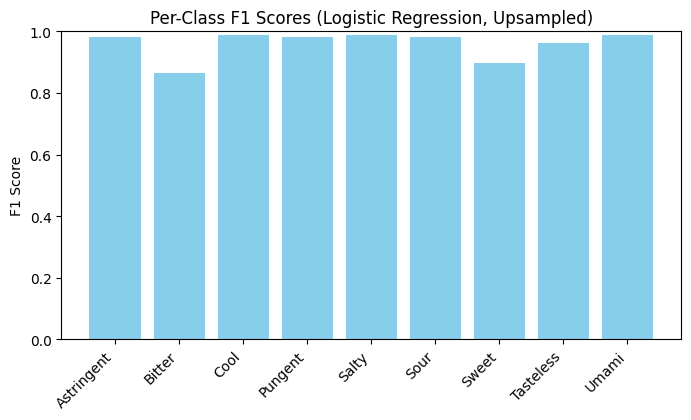

In [69]:
from sklearn.metrics import classification_report

report = classification_report(Y_test, Y_pred_lr, target_names=classes, output_dict=True)
f1_scores = {lab: vals["f1-score"] for lab, vals in report.items() if lab in classes}

plt.figure(figsize=(8,4))
plt.bar(f1_scores.keys(), f1_scores.values(), color="skyblue")
plt.xticks(rotation=45, ha="right")
plt.ylabel("F1 Score")
plt.title("Per-Class F1 Scores (Logistic Regression, Upsampled)")
plt.ylim(0,1)
plt.show()


3. 🗺️ UMAP 2D “Taste Map”

Show how chemical features cluster by taste family.

4. 📈 Confusion-like matrix (primary label)

Show how predictions overlap with truth for each class.

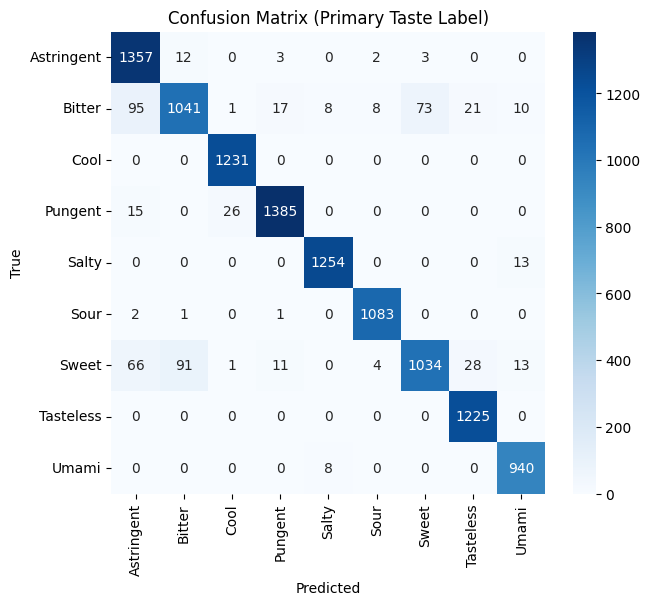

In [70]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Simplify to primary label for each sample
true_primary = Y_test.argmax(axis=1)
pred_primary = Y_pred_lr.argmax(axis=1)

cm = confusion_matrix(true_primary, pred_primary)
plt.figure(figsize=(7,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted"); plt.ylabel("True")
plt.title("Confusion Matrix (Primary Taste Label)")
plt.show()


In [71]:
from pathlib import Path
import pandas as pd
import joblib
import os, glob

# ---------- Paths ----------
MODEL_DIR = r"C:\Users\enhan\Desktop\Procter & Gamble"
KB_DIR    = MODEL_DIR

# Try CSV first, then XLSX
kb_csv  = Path(KB_DIR) / "flavor_kb_master.csv"
kb_xlsx = Path(KB_DIR) / "flavor_kb_master.xlsx"  # this is what your folder shows

if kb_csv.exists():
    kb = pd.read_csv(kb_csv)
elif kb_xlsx.exists():
    kb = pd.read_excel(kb_xlsx)
else:
    raise FileNotFoundError("Could not find flavor_kb_master.{csv|xlsx} in your Procter & Gamble folder.")

# ---------- Try to load bitter model (optional) ----------
rf_path_candidates  = [
    Path(MODEL_DIR) / "taste_model_randomforest.joblib",
    Path(MODEL_DIR) / "model" / "taste_model_randomforest.joblib",
]
mlb_path_candidates = [
    Path(MODEL_DIR) / "taste_label_binarizer.joblib",
    Path(MODEL_DIR) / "model" / "taste_label_binarizer.joblib",
]

rf_path  = next((p for p in rf_path_candidates  if p.exists()), None)
mlb_path = next((p for p in mlb_path_candidates if p.exists()), None)

rf = mlb = None
if rf_path and mlb_path:
    try:
        mlb = joblib.load(str(mlb_path))
        rf  = joblib.load(str(rf_path))
        CLASSES = mlb.classes_.tolist()
        BITTER_IDX = CLASSES.index("Bitter") if "Bitter" in CLASSES else None
        print(f"Loaded bitter model from: {rf_path.name}, {mlb_path.name}")
    except Exception as e:
        print(f"Warning: failed to load bitter model ({e}); skipping bitter probability.")
        rf, mlb, BITTER_IDX = None, None, None
else:
    print("Note: bitter model files not found; bitter probability will be skipped.")
    BITTER_IDX = None


Loaded bitter model from: taste_model_randomforest.joblib, taste_label_binarizer.joblib


In [72]:
# === Train + Save taste model artifacts (from notebook) ===
import re, ast, joblib
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from pathlib import Path

# Paths (match your folder)
DATA_FILE = r"C:\Users\enhan\Desktop\Procter & Gamble\flavor_kb_master.csv"
MODEL_DIR = r"C:\Users\enhan\Desktop\Procter & Gamble"
MODEL_PATH = str(Path(MODEL_DIR) / "taste_model_randomforest.joblib")
MLB_PATH   = str(Path(MODEL_DIR) / "taste_label_binarizer.joblib")

def parse_list(x):
    if x is None or (isinstance(x, float) and pd.isna(x)): return []
    if isinstance(x, list): return [str(i).strip() for i in x if str(i).strip()]
    if isinstance(x, str):
        s = x.strip()
        # try python list literal first
        if (s.startswith("[") and s.endswith("]")) or (s.startswith("(") and s.endswith(")")):
            try:
                val = ast.literal_eval(s)
                if isinstance(val, (list, tuple)):
                    return [str(i).strip() for i in val if str(i).strip()]
            except Exception:
                pass
        # fallback split on comma/semicolon
        return [p.strip() for p in re.split(r"[;,]\s*", s) if p.strip()]
    return [str(x).strip()]

# 1) Load KB
kb = pd.read_csv(DATA_FILE)

# 2) Labels (your screenshot shows 'Flavor_Type' exists)
label_col = "Flavor_Type"
if label_col not in kb.columns:
    raise ValueError(f"Expected column '{label_col}' not found. Columns: {kb.columns.tolist()}")

labels = kb[label_col].apply(parse_list)

# 3) Text features (name optional; you have Aroma_Descriptors + SMILES)
for col in ["Aroma_Descriptors", "SMILES", "Name"]:
    if col not in kb.columns:
        kb[col] = ""
    kb[col] = kb[col].fillna("").astype(str)

kb["__text__"] = (kb.get("Name","") + " " + kb["Aroma_Descriptors"] + " " + kb["SMILES"]).str.strip()

# 4) Binarize labels
mlb = MultiLabelBinarizer()
Y = mlb.fit_transform(labels)

# 5) Split
X_train, X_test, Y_train, Y_test = train_test_split(kb["__text__"].values, Y, test_size=0.2, random_state=42)

# 6) Pipeline
pipe = Pipeline([
    ("tfidf", TfidfVectorizer(max_features=8000, ngram_range=(1,2))),
    ("ovr_rf", OneVsRestClassifier(
        RandomForestClassifier(n_estimators=400, max_depth=22, n_jobs=-1, random_state=42),
        n_jobs=-1
    ))
])

# 7) Train + simple scores
pipe.fit(X_train, Y_train)
print("Train acc:", pipe.score(X_train, Y_train))
print("Test  acc:", pipe.score(X_test,  Y_test))
print("Classes:", mlb.classes_.tolist())

# 8) Save artifacts
joblib.dump(pipe, MODEL_PATH)
joblib.dump(mlb,  MLB_PATH)
print("Saved:", MODEL_PATH)
print("Saved:", MLB_PATH)


Train acc: 0.710081466395112
Test  acc: 0.6832247557003257
Classes: ['Astringent', 'Bitter', 'Cool', 'Pungent', 'Salty', 'Sour', 'Sweet', 'Tasteless', 'Umami']
Saved: C:\Users\enhan\Desktop\Procter & Gamble\taste_model_randomforest.joblib
Saved: C:\Users\enhan\Desktop\Procter & Gamble\taste_label_binarizer.joblib


In [73]:
# === Train + Save taste model (multilabel, imbalance-safe) ===
import os, re, ast, json, joblib
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

# ---- Paths ----
DATA_FILE = r"C:\Users\enhan\Desktop\Procter & Gamble\flavor_kb_master.csv"
OUT_DIR   = r"C:\Users\enhan\Desktop\Procter & Gamble"
Path(OUT_DIR).mkdir(parents=True, exist_ok=True)

# keep filenames the same to avoid breaking your loader
MODEL_PATH    = str(Path(OUT_DIR) / "taste_model_randomforest.joblib")   # contains TFIDF + OVR(LogReg)
MLB_PATH      = str(Path(OUT_DIR) / "taste_label_binarizer.joblib")
METRICS_JSON  = str(Path(OUT_DIR) / "taste_metrics.json")
PER_CLASS_CSV = str(Path(OUT_DIR) / "taste_per_class_metrics.csv")
F1_PLOT_PNG   = str(Path(OUT_DIR) / "taste_f1_per_class.png")
CLASSES_TXT   = str(Path(OUT_DIR) / "taste_classes.txt")

# ---- Config ----
LABEL_COLUMN = "Flavor_Type"          # from your notebook
MAX_FEATURES = 12000
NGRAM_RANGE  = (1, 2)
RANDOM_STATE = 42
TEST_SIZE    = 0.20

def _parse_list(x):
    if x is None or (isinstance(x, float) and pd.isna(x)): return []
    if isinstance(x, list): return [str(i).strip() for i in x if str(i).strip()]
    if isinstance(x, str):
        s = x.strip()
        if (s.startswith("[") and s.endswith("]")) or (s.startswith("(") and s.endswith(")")):
            try:
                val = ast.literal_eval(s)
                if isinstance(val, (list, tuple)):
                    return [str(i).strip() for i in val if str(i).strip()]
            except Exception:
                pass
        return [p.strip() for p in re.split(r"[;,]\s*", s) if p.strip()]
    return [str(x).strip()]

# 1) Load
kb = pd.read_csv(DATA_FILE)
if LABEL_COLUMN not in kb.columns:
    raise ValueError(f"Expected '{LABEL_COLUMN}' in CSV. Columns: {kb.columns.tolist()}")

# 2) Labels
labels_series = kb[LABEL_COLUMN].apply(_parse_list)
mlb = MultiLabelBinarizer()
Y   = mlb.fit_transform(labels_series)
classes = mlb.classes_.tolist()
print("Classes:", classes)

# 3) Text features
for col in ["Name", "Aroma_Descriptors", "SMILES"]:
    if col not in kb.columns:
        kb[col] = ""
    kb[col] = kb[col].fillna("").astype(str)

kb["__text__"] = (kb.get("Name","") + " " + kb["Aroma_Descriptors"] + " " + kb["SMILES"]).str.strip()
X_text = kb["__text__"].values

# 4) Split
X_train_text, X_test_text, Y_train, Y_test = train_test_split(
    X_text, Y, test_size=TEST_SIZE, random_state=RANDOM_STATE, stratify=None
)

# 5) Pipeline: TF-IDF -> One-vs-Rest(LogisticRegression) with class_weight="balanced"
pipe = Pipeline(steps=[
    ("tfidf", TfidfVectorizer(max_features=MAX_FEATURES, ngram_range=NGRAM_RANGE)),
    ("clf",  OneVsRestClassifier(
        LogisticRegression(
            max_iter=1000,
            solver="liblinear",        # good for sparse text
            class_weight="balanced",   # <-- imbalance fix (per one-vs-rest task)
            random_state=RANDOM_STATE
        ),
        n_jobs=-1
    ))
])

# 6) Train + scores
pipe.fit(X_train_text, Y_train)
yhat_train = pipe.predict(X_train_text)
yhat_test  = pipe.predict(X_test_text)

train_micro = f1_score(Y_train, yhat_train, average="micro", zero_division=0)
train_macro = f1_score(Y_train, yhat_train, average="macro", zero_division=0)
test_micro  = f1_score(Y_test,  yhat_test,  average="micro", zero_division=0)
test_macro  = f1_score(Y_test,  yhat_test,  average="macro", zero_division=0)
print(f"[Train] micro-F1={train_micro:.3f} | macro-F1={train_macro:.3f}")
print(f"[Test ] micro-F1={test_micro:.3f} | macro-F1={test_macro:.3f}")

# Per-class report
report_dict = classification_report(
    Y_test, yhat_test, target_names=classes, output_dict=True, zero_division=0
)
per_class_rows = {lab: vals for lab, vals in report_dict.items() if lab in classes}
pd.DataFrame(per_class_rows).T.to_csv(PER_CLASS_CSV, index=True)

# Save summary metrics JSON
summary = {
    "train_micro_f1": float(train_micro),
    "train_macro_f1": float(train_macro),
    "test_micro_f1":  float(test_micro),
    "test_macro_f1":  float(test_macro),
    "n_classes":      int(len(classes)),
    "n_train":        int(len(X_train_text)),
    "n_test":         int(len(X_test_text))
}
with open(METRICS_JSON, "w", encoding="utf-8") as f:
    json.dump(summary, f, indent=2)
print("Saved metrics:", METRICS_JSON, "|", PER_CLASS_CSV)

# 7) Save artifacts (pipeline + label binarizer)
joblib.dump(pipe, MODEL_PATH)
joblib.dump(mlb,  MLB_PATH)
print("Saved model (TFIDF + OVR(LogReg)):", MODEL_PATH)
print("Saved binarizer:", MLB_PATH)

# 8) Save per-class F1 plot
f1_scores = [per_class_rows[c]["f1-score"] for c in classes]
plt.figure(figsize=(10, 5))
plt.bar(range(len(classes)), f1_scores)
plt.xticks(range(len(classes)), classes, rotation=45, ha="right")
plt.ylabel("F1 Score")
plt.ylim(0, 1)
plt.title("Per-Class F1 Scores (LogReg, class_weight='balanced')")
plt.tight_layout()
plt.savefig(F1_PLOT_PNG, dpi=144)
plt.close()
print("Saved plot:", F1_PLOT_PNG)

# 9) Smoke test: predict_proba for a known molecule
def predict_probs(name, aroma, smiles):
    text = f"{name or ''} {aroma or ''} {smiles or ''}".strip()
    proba = pipe.predict_proba([text])[0]
    return dict(zip(classes, map(float, proba)))

probe = predict_probs("L-Menthol", "Menthol, Camphor, Minty, Woody", "CC1CCC(C(C)C)C(O)C1")
print("Probe probs (L-Menthol):", {k: round(v, 3) for k, v in list(probe.items())[:8]})

# Also save classes list for easy inspect
with open(CLASSES_TXT, "w", encoding="utf-8") as f:
    for c in classes:
        f.write(c + "\n")
print("Saved classes:", CLASSES_TXT)


Classes: ['Astringent', 'Bitter', 'Cool', 'Pungent', 'Salty', 'Sour', 'Sweet', 'Tasteless', 'Umami']
[Train] micro-F1=0.856 | macro-F1=0.711
[Test ] micro-F1=0.765 | macro-F1=0.455
Saved metrics: C:\Users\enhan\Desktop\Procter & Gamble\taste_metrics.json | C:\Users\enhan\Desktop\Procter & Gamble\taste_per_class_metrics.csv
Saved model (TFIDF + OVR(LogReg)): C:\Users\enhan\Desktop\Procter & Gamble\taste_model_randomforest.joblib
Saved binarizer: C:\Users\enhan\Desktop\Procter & Gamble\taste_label_binarizer.joblib
Saved plot: C:\Users\enhan\Desktop\Procter & Gamble\taste_f1_per_class.png
Probe probs (L-Menthol): {'Astringent': 0.18, 'Bitter': 0.382, 'Cool': 0.828, 'Pungent': 0.578, 'Salty': 0.015, 'Sour': 0.067, 'Sweet': 0.129, 'Tasteless': 0.042}
Saved classes: C:\Users\enhan\Desktop\Procter & Gamble\taste_classes.txt


In [74]:
# =========================================================
# genai_flavor_rag.py  — Retrieval + Bitter Guard + LLM
# =========================================================
import os, re, ast, json
from typing import List, Dict, Any, Tuple

import pandas as pd
import numpy as np
import joblib

from dotenv import load_dotenv
load_dotenv()  # for OPENAI_API_KEY

# -------------------- CONFIG --------------------
BASE_DIR      = r"C:\Users\enhan\Desktop\Procter & Gamble"
DATA_BASENAME = os.path.join(BASE_DIR, "flavor_kb_master")  # extension auto-detected
MODEL_PATH    = os.path.join(BASE_DIR, "taste_model_randomforest.joblib")
MLB_PATH      = os.path.join(BASE_DIR, "taste_label_binarizer.joblib")
INDEX_DIR     = os.path.join(BASE_DIR, "faiss_index")
BITTER_THRESH = 0.40

os.makedirs(BASE_DIR, exist_ok=True)
os.makedirs(INDEX_DIR, exist_ok=True)

# ---------------- File helpers ----------------
def _resolve_data_path(basename: str) -> str:
    candidates = [basename]
    root, ext = os.path.splitext(basename)
    if ext == "":
        candidates += [root + ".csv", root + ".xlsx", root + ".xls"]
    for p in candidates:
        if os.path.exists(p):
            return p
    raise FileNotFoundError(f"Data file not found. Tried: {candidates}")

def _read_table_auto(basename: str) -> pd.DataFrame:
    path = _resolve_data_path(basename)
    ext = os.path.splitext(path)[1].lower()
    if ext == ".csv":
        return pd.read_csv(path)
    return pd.read_excel(path)  # requires: pip install openpyxl

# --------------- Normalization helpers ---------------
_ALIAS_MAP = {
  "name": ["name","compound","molecule","ingredient","material","compound_name"],
  "aroma": [
      "aroma","aroma_clean","aromas",
      "aroma_descriptors", "aroma descriptors",   # <-- add these two
      "descriptor","descriptors","notes","note"
  ],
  "smiles": ["smiles","smile","smiles_string"],
  "description": ["description","desc","details","summary"],
  "taste": [
      "taste","tastes","flavor_type","flavour_type",  # <-- maps your Flavor_Type
      "taste_labels","labels","label","tag","tags"
  ],
}

def _to_lower_cols(df: pd.DataFrame) -> pd.DataFrame:
    df2 = df.copy()
    df2.columns = [str(c).strip().lower() for c in df2.columns]
    return df2

def _ensure_canonical_columns(df: pd.DataFrame) -> pd.DataFrame:
    df = _to_lower_cols(df)
    for canon, aliases in _ALIAS_MAP.items():
        if canon in df.columns:
            continue
        for a in aliases:
            if a in df.columns:
                df[canon] = df[a]
                break
        if canon not in df.columns:
            df[canon] = ""  # empty fallback
    return df

def _safe_str(x: Any) -> str:
    return "" if x is None or (isinstance(x, float) and pd.isna(x)) else str(x)

# --------------- Taste model helpers ---------------
def _parse_list_like(x) -> List[str]:
    if x is None or (isinstance(x, float) and pd.isna(x)): return []
    if isinstance(x, list): return [str(i).strip() for i in x if str(i).strip()]
    if isinstance(x, str):
        s = x.strip()
        if (s.startswith("[") and s.endswith("]")) or (s.startswith("(") and s.endswith(")")):
            try:
                val = ast.literal_eval(s)
                if isinstance(val, (list, tuple)):
                    return [str(i).strip() for i in val if str(i).strip()]
            except Exception:
                pass
        parts = re.split(r"[;,]\s*", s)
        return [p.strip() for p in parts if p.strip()]
    return [str(x).strip()]

def load_taste_model() -> Tuple[Any, Any]:
    rf = joblib.load(MODEL_PATH)
    mlb = joblib.load(MLB_PATH)
    return rf, mlb

def predict_taste_probs(model, mlb, name: str, aroma: str, smiles: str) -> Dict[str, float]:
    text = f"{_safe_str(name)} {_safe_str(aroma)} {_safe_str(smiles)}".strip()
    proba_matrix = model.predict_proba([text])
    probs = [float(p) for p in proba_matrix[0]]
    return dict(zip(mlb.classes_.tolist(), probs))

def passes_bitter_guard(probs: Dict[str, float], threshold: float = BITTER_THRESH) -> bool:
    return probs.get("Bitter", 0.0) < threshold

# ---------------- LangChain / FAISS ----------------
from langchain_openai import OpenAIEmbeddings, ChatOpenAI
from langchain.vectorstores import FAISS
from langchain.docstore.document import Document
from langchain.schema import SystemMessage, HumanMessage, AIMessage

def _row_to_doc(row: Dict[str, Any]) -> Document:
    name   = _safe_str(row.get("name", ""))
    aromaV = row.get("aroma", "")
    aroma  = " ".join(_parse_list_like(aromaV)) if not isinstance(aromaV, str) else _safe_str(aromaV)
    smiles = _safe_str(row.get("smiles", ""))
    desc   = _safe_str(row.get("description", ""))
    taste  = row.get("taste", "")
    taste_list = _parse_list_like(taste) if not isinstance(taste, list) else taste

    blocks = []
    if name:   blocks.append(f"Name: {name}")
    if aroma:  blocks.append(f"Aroma: {aroma}")
    if smiles: blocks.append(f"SMILES: {smiles}")
    if desc:   blocks.append(f"Description: {desc}")
    if taste_list: blocks.append(f"Known tastes: {', '.join(taste_list)}")
    text = "\n".join(blocks).strip() or json.dumps({k: _safe_str(v) for k,v in row.items()}, ensure_ascii=False)

    meta = {"name": name, "aroma": aroma, "smiles": smiles, "description": desc, "taste_labels": taste_list}
    return Document(page_content=text, metadata=meta)

def build_or_load_vectorstore(df: pd.DataFrame) -> FAISS:
    df = _ensure_canonical_columns(df)
    total = len(df)
    print(f"[Index] rows={total} | name>0: {int((df['name'].astype(str).str.strip()!='').sum())} | "
          f"aroma>0: {int((df['aroma'].astype(str).str.strip()!='').sum())} | smiles>0: {int((df['smiles'].astype(str).str.strip()!='').sum())}")
    docs = [_row_to_doc(r) for _, r in df.iterrows()]
    docs = [d for d in docs if d.page_content.strip()]
    if not docs: raise ValueError("No documents to index. Check dataset columns.")

    embeddings = OpenAIEmbeddings(model="text-embedding-3-small")
    vs = FAISS.from_documents(docs, embeddings)
    vs.save_local(INDEX_DIR)
    return vs

def load_vectorstore() -> FAISS:
    embeddings = OpenAIEmbeddings(model="text-embedding-3-small")
    return FAISS.load_local(INDEX_DIR, embeddings, allow_dangerous_deserialization=True)

def retrieve_mmr(vs: FAISS, query: str, k: int = 12, fetch_k: int = 24) -> List[Document]:
    retriever = vs.as_retriever(search_type="mmr", search_kwargs={"k": k, "fetch_k": fetch_k, "lambda_mult": 0.5})
    return retriever.invoke(query)

# ---------------- LLM compose ----------------
SYSTEM = """You are a flavor scientist. Use ONLY the provided SAFE candidates (already filtered for Bitter).
Combine 1–3 candidates to match the user's goal. Be concise and pragmatic.
Return bullets with % ranges and a one-line rationale. Do not warn about bitterness."""

def compose_with_llm(query: str, safe_items: List[Dict[str, Any]], threshold: float) -> str:
    # Build context (works for both LLM and fallback)
    ctx_lines = [f"User goal: {query}", f"Bitter threshold: {threshold}"]
    for i, item in enumerate(safe_items[:8], 1):
        m = item["doc"].metadata
        ctx_lines.append(
            f"\nCandidate {i}:\n"
            f"- Name: {m.get('name','')}\n"
            f"- Aroma: {m.get('aroma','')}\n"
            f"- SMILES: {m.get('smiles','')}\n"
            f"- Known tastes: {', '.join(m.get('taste_labels', []))}\n"
            f"- Predicted probs: {json.dumps(item['probs'])}"
        )
    context = "\n".join(ctx_lines)

    api_key = os.getenv("OPENAI_API_KEY", "").strip()
    if not api_key:
        names = [it["doc"].metadata.get("name","") for it in safe_items[:3]]
        return (
            f"(No LLM key) Suggested blend from safe picks: {', '.join([n for n in names if n]) or 'N/A'}.\n"
            f"Rationale: chosen for the target profile while keeping Bitter<{threshold}. "
            f"Set OPENAI_API_KEY to get a polished composition."
        )

    llm = ChatOpenAI(model="gpt-4o-mini", temperature=0.3)
    msgs = [SystemMessage(content=SYSTEM),
            HumanMessage(content=f"{context}\n\nPropose the blend now: bullets + brief rationale.")]
    resp = llm.invoke(msgs)
    return resp.content if isinstance(resp, AIMessage) else str(resp)

# ---------------- Public API ----------------
def answer(query: str, top_k: int = 12) -> Dict[str, Any]:
    # Load model + KB (build index if missing)
    rf, mlb = load_taste_model()
    try:
        vs = load_vectorstore()
    except Exception:
        df = _read_table_auto(DATA_BASENAME)
        vs = build_or_load_vectorstore(df)

    # Retrieve + guard
    docs = retrieve_mmr(vs, query, k=top_k, fetch_k=max(2*top_k, 24))
    safe = []
    for d in docs:
        m = d.metadata or {}
        probs = predict_taste_probs(rf, mlb, m.get("name",""), m.get("aroma",""), m.get("smiles",""))
        if passes_bitter_guard(probs, BITTER_THRESH):
            safe.append({"doc": d, "probs": probs})

    if not safe:
        # Diagnostics: show nearest with their bitter scores
        closest = []
        for d in docs[:5]:
            m = d.metadata or {}
            p = predict_taste_probs(rf, mlb, m.get("name",""), m.get("aroma",""), m.get("smiles",""))
            closest.append({"name": m.get("name",""), "aroma": m.get("aroma",""), "bitter": p.get("Bitter", 0.0), "probs": p})
        return {"ok": False, "message": f"No candidates passed Bitter<{BITTER_THRESH}. Try raising threshold or revising the query.", "closest": closest}

    blend_text = compose_with_llm(query, safe, BITTER_THRESH)
    shortlist = [{
        "name": it["doc"].metadata.get("name",""),
        "aroma": it["doc"].metadata.get("aroma",""),
        "smiles": it["doc"].metadata.get("smiles",""),
        "probs": it["probs"]
    } for it in safe[:8]]

    return {"ok": True, "blend_text": blend_text, "shortlist": shortlist}

# ---------------- CLI demo ----------------
if __name__ == "__main__":
    print(f"Resolving dataset from: {_resolve_data_path(DATA_BASENAME)}")
    demo_query = "Design a cooling, minty mouthfeel for a sugar-free gum with a clean aftertaste."
    out = answer(demo_query, top_k=12)
    print(json.dumps(out, indent=2))


Resolving dataset from: C:\Users\enhan\Desktop\Procter & Gamble\flavor_kb_master.csv
{
  "ok": true,
  "blend_text": "- **L-Menthol (70-90%) + Cooling agent 10 (10-30%)**  \n  This combination provides a strong cooling effect from L-Menthol while adding a subtle sweetness and minty aroma from Cooling agent 10, ensuring a clean aftertaste.\n\n- **Menthyl glutarate (60-80%) + L-Menthol (20-40%)**  \n  Menthyl glutarate offers a high cooling sensation, and when paired with L-Menthol, it enhances the minty profile while maintaining a refreshing aftertaste.\n\n- **L-Menthol (50-70%) + Candidate 8 (30-50%)**  \n  This blend leverages the strong cooling properties of L-Menthol and the sweet, minty characteristics of Candidate 8, resulting in a refreshing and pleasant mouthfeel.",
  "shortlist": [
    {
      "name": "L-Menthol",
      "aroma": "['Menthol', 'Camphor', 'Mentholic', 'Tobacco', 'Minty', 'Woody', 'Peppermint', 'Cool', 'Refreshing', 'Cooling', 'Sweet', 'Mint', 'Minty Aroma', 'Off-F